#**BVRIT BUS NUMBER PLATE REGISTRATION DETECTION USING YOLO V8**

In [1]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [2]:
%cd /content/gdrive/MyDrive/

/content/gdrive/MyDrive


In [3]:
#making the minor project
import os
if not os.path.isdir("minorproject"):
  os.makedirs("minorproject")

In [4]:
current_path = os.getcwd()
print("Current path",current_path)

Current path /content/gdrive/MyDrive


In [5]:
os.getcwd()

'/content/gdrive/MyDrive'

In [6]:
%cd minorproject
print("Now the path is:")
os.getcwd()

/content/gdrive/MyDrive/minorproject
Now the path is:


'/content/gdrive/MyDrive/minorproject'

###**IMPORTING THE MODULUS**

In [7]:
from matplotlib import pyplot as plt
import numpy as np
import cv2
from google.colab.patches import cv2_imshow


###**BUS IMAGE BEFORE DETECTION**

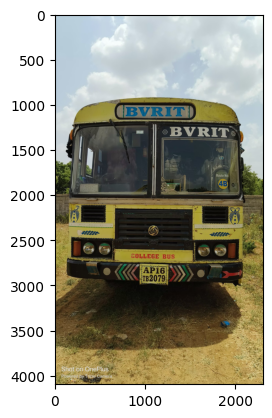

In [8]:
chai = cv2.imread('/content/gdrive/MyDrive/minorproject/images/train/AP16TB2079.jpg')
plt.imshow(cv2.cvtColor(chai,cv2.COLOR_BGR2RGB))


COLONING THE ULTRALYTICS (YOLO V8)

In [9]:
os.getcwd()

'/content/gdrive/MyDrive/minorproject'

In [ ]:
!git clone https://github.com/ultralytics/ultralytics.git

fatal: destination path 'ultralytics' already exists and is not an empty directory.


TRAINING THE YOLO MODEL FOR 50 EPOCHS

In [10]:
pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 606.2/606.2 kB 9.5 MB/s eta 0:00:00


In [ ]:
!yolo task=detect mode=train model=yolov8x.pt data='/content/gdrive/MyDrive/minorproject/ultralytics/ultralytics/datasets/custom_data.yaml'  epochs=50 imgsz=640

Ultralytics YOLOv8.0.139 🚀 Python-3.10.6 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8x.pt, data=/content/gdrive/MyDrive/minorproject/ultralytics/ultralytics/datasets/custom_data.yaml, epochs=50, patience=50, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=None, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, line_width=None, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, boxes=True, format=torchs

Showing the results of training

In [11]:
# to print the whole graphs presenrt in the runs folder

%load_ext tensorboard
%tensorboard  --logdir runs

Output hidden; open in https://colab.research.google.com to view.

PREDICTING

In [ ]:
!yolo predict model='/content/gdrive/MyDrive/minorproject/runs/detect/train/weights/best.pt' source='/content/gdrive/MyDrive/minorproject/images/train/AP16TB2079.jpg'

Ultralytics YOLOv8.0.139 🚀 Python-3.10.6 torch-2.0.1+cu118 CPU (Intel Xeon 2.20GHz)
Model summary (fused): 268 layers, 68125494 parameters, 0 gradients

image 1/1 /content/gdrive/MyDrive/minorproject/images/train/AP16TB2079.jpg: 640x384 1 bus, 1 number plate, 4798.3ms
Speed: 16.6ms preprocess, 4798.3ms inference, 33.1ms postprocess per image at shape (1, 3, 640, 384)
Results saved to runs/detect/predict3


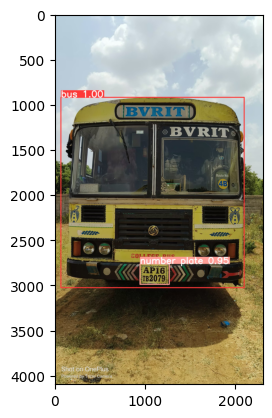

In [ ]:
#showing
predicted_image=cv2.imread('/content/gdrive/MyDrive/minorproject/runs/detect/predict/AP16TB2079.jpg')
plt.imshow(cv2.cvtColor(predicted_image,cv2.COLOR_BGR2RGB))

#IMAGE 2

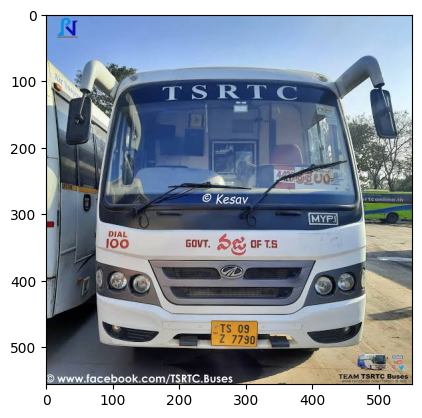

In [12]:
image2=cv2.imread('/content/gdrive/MyDrive/minorproject/images/test/non_bvrit4.jpg')
plt.imshow(cv2.cvtColor(image2,cv2.COLOR_BGR2RGB))

In [ ]:
!yolo predict model='/content/gdrive/MyDrive/minorproject/runs/detect/train/weights/best.pt' source='/content/gdrive/MyDrive/minorproject/images/test/non_bvrit4.jpg'

Ultralytics YOLOv8.0.139 🚀 Python-3.10.6 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 268 layers, 68125494 parameters, 0 gradients

image 1/1 /content/gdrive/MyDrive/minorproject/images/test/non_bvrit4.jpg: 640x640 2 buss, 1 number plate, 84.5ms
Speed: 5.5ms preprocess, 84.5ms inference, 160.2ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/detect/predict2


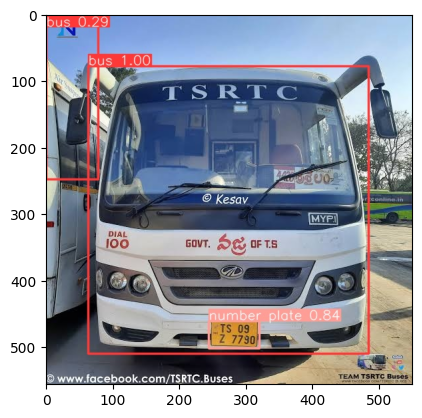

In [ ]:
#showing
predicted_image2=cv2.imread('/content/gdrive/MyDrive/minorproject/runs/detect/predict2/non_bvrit4.jpg')
plt.imshow(cv2.cvtColor(predicted_image2,cv2.COLOR_BGR2RGB))

#DEFINING A FUNCTION FOR DETECTION
NOW WE GIVE EXAMPLES

In [13]:
from ultralytics import YOLO

HERE WE GIVE THE PATH OF THE IMAGE

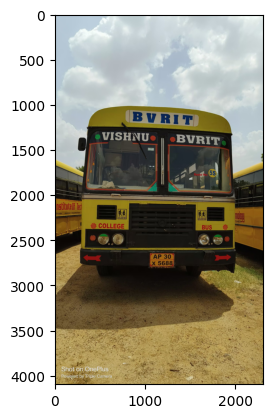

In [14]:
image_path='/content/gdrive/MyDrive/minorproject/images/train/AP30X5688.jpg'
image_res=cv2.imread(image_path)
plt.imshow(cv2.cvtColor(image_res,cv2.COLOR_BGR2RGB))

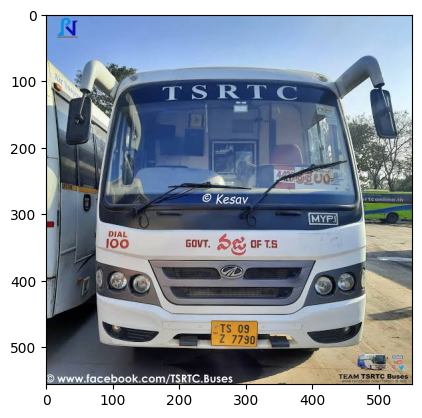

In [32]:
non_image_path='/content/gdrive/MyDrive/minorproject/images/test/non_bvrit4.jpg'
non_image=cv2.imread(non_image_path)
plt.imshow(cv2.cvtColor(non_image,cv2.COLOR_BGR2RGB))

#  MODEL

In [15]:
model=YOLO('yolov8n.pt')
model=YOLO('/content/gdrive/MyDrive/minorproject/runs/detect/train/weights/best.pt')

In [16]:
results=model(image_path)


image 1/1 /content/gdrive/MyDrive/minorproject/images/train/AP30X5688.jpg: 640x384 1 bus, 1 number plate, 69.4ms
Speed: 12.1ms preprocess, 69.4ms inference, 38.5ms postprocess per image at shape (1, 3, 640, 384)


In [33]:
results2=model(non_image)


0: 640x640 2 buss, 1 number plate, 103.9ms
Speed: 7.3ms preprocess, 103.9ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


#METRICS

In [ ]:
metrics = model.val()  # no arguments needed, dataset and settings remembered
metrics.box.map    # map50-95
metrics.box.map50  # map50
metrics.box.map75  # map75
metrics.box.maps

Ultralytics YOLOv8.0.139 🚀 Python-3.10.6 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
val: Scanning /content/gdrive/MyDrive/minorproject/labels/test.cache... 10 images, 0 backgrounds, 0 corrupt: 100%|██████████| 10/10 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:04<00:00,  4.88s/it]
                   all         10         20      0.992       0.95       0.99      0.846
                   bus         10         10      0.989          1      0.995      0.953
          number plate         10         10      0.995        0.9      0.986      0.738
Speed: 0.3ms preprocess, 68.0ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to runs/detect/val


array([    0.95289,     0.73827])

#COORDINATES OF THE BOUNDING BOX OF NUMBER PLATE

In [17]:
print("PREPROCESS TIME:",results[0].speed['preprocess'],"seconds")
print("INFERENCE TIME:",results[0].speed['inference'],"seconds")
print("POST PROCESS TIME:",results[0].speed['postprocess'],"seconds")
total_time = results[0].speed['preprocess']+results[0].speed['inference']+results[0].speed['postprocess']
print("TOTAL TIME OF DETECTION IS:",total_time,"seconds")

PREPROCESS TIME: 12.132883071899414 seconds
INFERENCE TIME: 69.41747665405273 seconds
POST PROCESS TIME: 38.5441780090332 seconds
TOTAL TIME OF DETECTION IS: 120.09453773498535 seconds


In [34]:
print("PREPROCESS TIME:",results2[0].speed['preprocess'],"seconds")
print("INFERENCE TIME:",results2[0].speed['inference'],"seconds")
print("POST PROCESS TIME:",results2[0].speed['postprocess'],"seconds")
total_time = results2[0].speed['preprocess']+results2[0].speed['inference']+results2[0].speed['postprocess']
print("TOTAL TIME OF DETECTION IS:",total_time,"seconds")

PREPROCESS TIME: 7.300853729248047 seconds
INFERENCE TIME: 103.87301445007324 seconds
POST PROCESS TIME: 1.798868179321289 seconds
TOTAL TIME OF DETECTION IS: 112.97273635864258 seconds


In [35]:
print("The pathe of the image is : ",results[0].path)

The pathe of the image is :  /content/gdrive/MyDrive/minorproject/images/train/AP30X5688.jpg


In [39]:
boxes = results[0].boxes
l=len(boxes)
for kittu in range(len(boxes)):
  box = boxes[kittu]  # returns one box
  classs_number=box.cls
  # print(box.conf.item())
  if(classs_number==1):
    print("-------------------------------NUMBER PLATE DETECTED-------------------------------\n")
    print("THE CONFIDENCE OF DETECTION OF NUMBER PLATE:",box.conf.item()*100,"%")
    print("\nCORRDINATES OF THE BOUNDING NUMBER PLATE REGION ARE:")
    x_min, y_min, x_max, y_max = box.xyxy[0].tolist()
    print("x_min=",x_min)
    print("y_min=",y_min)
    print("x_max=",x_max)
    print("y_max=",y_max)
    # print(bounding_boxes_xyxy_np)

-------------------------------NUMBER PLATE DETECTED-------------------------------

THE CONFIDENCE OF DETECTION OF NUMBER PLATE: 94.91965174674988 %

CORRDINATES OF THE BOUNDING NUMBER PLATE REGION ARE:
x_min= 1039.6292724609375
y_min= 2632.709716796875
x_max= 1330.9476318359375
y_max= 2817.719970703125


In [40]:
boxes = results2[0].boxes
l=len(boxes)
for kittu in range(len(boxes)):
  box = boxes[kittu]  # returns one box
  classs_number=box.cls
  # print(box.conf.item())
  if(classs_number==1):
    print("-------------------------------NUMBER PLATE DETECTED-------------------------------\n")
    print("THE CONFIDENCE OF DETECTION OF NUMBER PLATE:",box.conf.item()*100,"%")
    print("\nCORRDINATES OF THE BOUNDING NUMBER PLATE REGION ARE:")
    x_min1, y_min1, x_max1, y_max1 = box.xyxy[0].tolist()
    print("x_min=",x_min1)
    print("y_min=",y_min1)
    print("x_max=",x_max1)
    print("y_max=",y_max1)
    # print(bounding_boxes_xyxy_np)

-------------------------------NUMBER PLATE DETECTED-------------------------------

THE CONFIDENCE OF DETECTION OF NUMBER PLATE: 83.65635871887207 %

CORRDINATES OF THE BOUNDING NUMBER PLATE REGION ARE:
x_min= 244.81517028808594
y_min= 461.496337890625
x_max= 320.1836853027344
y_max= 502.3351135253906


#REGION OF INTEREST (NUMBER PLATE REGION)

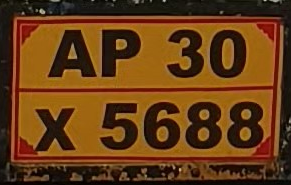

In [20]:
roi = image_res[int(y_min):int(y_max), int(x_min):int(x_max)]
cv2_imshow(roi)

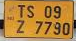

In [42]:
roi2=non_image[int(y_min1):int(y_max1), int(x_min1):int(x_max1)]
cv2_imshow(roi2)

#IMAGE PREPOCESSING


##GRAY SCALING

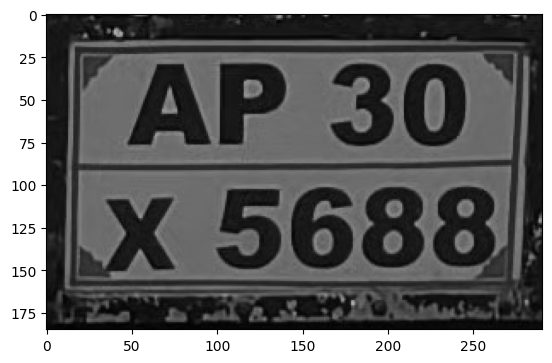

In [21]:
gray = cv2.cvtColor(roi,cv2.COLOR_BGR2GRAY)
plt.imshow(cv2.cvtColor(gray,cv2.COLOR_BGR2RGB))

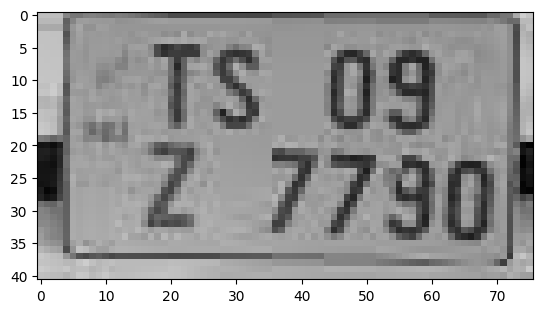

In [43]:
gray2 = cv2.cvtColor(roi2,cv2.COLOR_BGR2GRAY)
plt.imshow(cv2.cvtColor(gray2,cv2.COLOR_BGR2RGB))

##GAUSSIAN BLUR

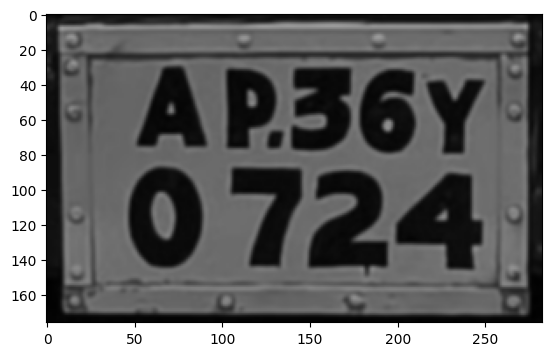

In [ ]:
blurred=cv2.GaussianBlur(gray,(5,5),0)
plt.imshow(cv2.cvtColor(blurred,cv2.COLOR_BGR2RGB))

##EDGE DETECTION

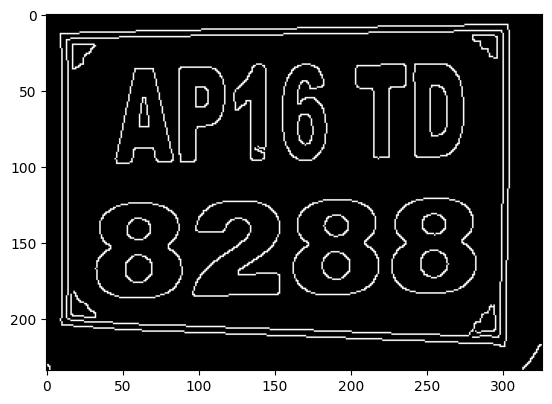

In [ ]:
bfilter = cv2.bilateralFilter(blurred,11,17,17)
edged = cv2.Canny(bfilter,30,200)
plt.imshow(cv2.cvtColor(edged,cv2.COLOR_BGR2RGB))

#EASY OCR (CHARACTER RECOGNITION)

In [22]:
!pip install easyocr

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.9/2.9 MB 11.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 813.9/813.9 kB 17.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 146.0/146.0 kB 16.8 MB/s eta 0:00:00


In [23]:
import easyocr

In [24]:
reader = easyocr.Reader(['en'])

Progress: |██████████████████████████████████████████████████| 100.0% Complete

Progress: |██████████████████████████████████████████████████| 100.0% Complete

In [25]:
result_t = reader.readtext(gray, detail = 0,paragraph=True)
result_t

['AP 30 X 5688']

In [44]:
result_t2 = reader.readtext(gray2, detail = 0,paragraph=True)
result_t2

['TS 09 1 7790)']

In [26]:
text=result_t[0]
text

'AP 30 X 5688'

In [46]:
text2=result_t2[0]
text2

'TS 09 1 7790)'

##VALIDATING WITH THE FILE

In [47]:
import pandas as pd
import csv

In [48]:
df = pd.read_csv('/content/gdrive/MyDrive/minorproject/chaithu.csv')
df.head()

,DETECTED,BUS
0,AP16 TB 2528,AP 16 TB 2528
1,TSOOUA 8494,TS 09 UA 8494
2,TS.12 0p8284,TS 12 UD 8284
3,TS12 UD.9790,TS 12 UD 8790
4,TS 12 UE 0374,TS 12 UE 0374


checking in the csv sheet

BUS BELONGS TO BV RAJU INSTITUTE OF TECHNOLOGY
 The with bus number: AP 30 X 5688


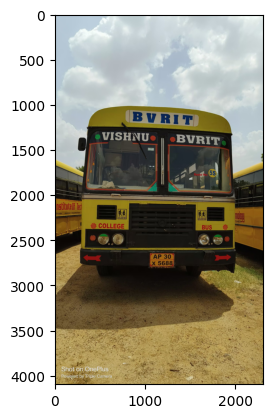

In [52]:
found =False
for ele in df[' DETECTED']:
  if(ele == text):
    ind = df[df[' DETECTED']==text].index[0]
    print("BUS BELONGS TO BV RAJU INSTITUTE OF TECHNOLOGY\n The with bus number:",df.at[ind,'BUS'])
    found = True
    image_res=cv2.imread(image_path)
    plt.imshow(cv2.cvtColor(image_res,cv2.COLOR_BGR2RGB))
    break
if(found==False):
  print("BUS DOES NOT BELONGS TO BV RAJU INSTITUTE OF TECHNOLOGY")

BUS DOES NOT BELONGS TO BV RAJU INSTITUTE OF TECHNOLOGY


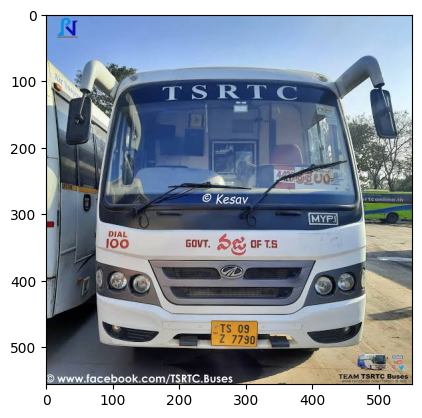

In [51]:
found =False
for ele in df[' DETECTED']:
  if(ele == text2):
    ind = df[df[' DETECTED']==text2].index[0]
    print("BUS BELONGS TO BV RAJU INSTITUTE OF TECHNOLOGY\n The with bus number:",df.at[ind,'BUS'])
    found = True

    break
if(found==False):
  print("BUS DOES NOT BELONGS TO BV RAJU INSTITUTE OF TECHNOLOGY")
  non_image=cv2.imread(non_image_path)
  plt.imshow(cv2.cvtColor(non_image,cv2.COLOR_BGR2RGB))